# Plotting the outputs of the face detection API

## from https://console.faceplusplus.com/documents/5679127

In [24]:
# !pip install azure

In [28]:
# pip install azure-cognitiveservices-vision-customvision


In [26]:
# pip install azure-cognitiveservices-vision-face

In [30]:
# !pip3 install --upgrade requests


In [34]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
ls drive/MyDrive/0296

 0296.jpeg
 AnnotationTask_ObjectDetection.gdoc
 atomatic_BB_annotation.gdoc
'Colab Notebooks'/
 Competitors.gdoc
 DataCollectionProcedure.gdoc
 ExtremeDB.zip
 faceAPI_MSFT.ipynb
 hybrid_images.ipynb
 Law_of_robustness_CIFAR.ipynb
 Output.zip
'recipe for synthetic data generation.gdoc'
'Screen Recording 2022-02-08 at 4.37.33 PM.mov'
 ShopAssist_CustomerJourney.gdoc
 Shop_assist_data_collection_strategy.gdoc
 shopassist_img_cap.zip
 ShopAssist_SystemDesign.gdoc
 taxonomy.gdoc
'Untitled document.gdoc'


In [63]:
import cv2
# img = cv2.imread(f'./face/{res[0]}')
img = Image.open('drive/MyDrive/0296.jpeg')

In [64]:
img.shape

AttributeError: ignored

In [5]:
import asyncio
import io
import glob
import os
import sys
import time
import uuid
import requests
from urllib.parse import urlparse
from io import BytesIO
# To install this module, run:
# python -m pip install Pillow
from PIL import Image, ImageDraw
from azure.cognitiveservices.vision.face import FaceClient
from msrest.authentication import CognitiveServicesCredentials
from azure.cognitiveservices.vision.face.models import TrainingStatusType, Person, QualityForRecognition



In [6]:
KEY = '6122f16de8e545b1b0fc8c18eafbbf45'
ENDPOINT = 'https://borjiface.cognitiveservices.azure.com/'


In [7]:
face_client = FaceClient(ENDPOINT, CognitiveServicesCredentials(KEY))


In [23]:
face_client.face.detect_with_stream?

1 0080.jpeg 1
((49, 70), (193, 263))


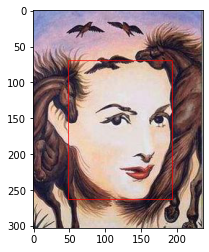

2 0059.jpeg 2
3 0192.jpeg 3
((134, -51), (583, 433))


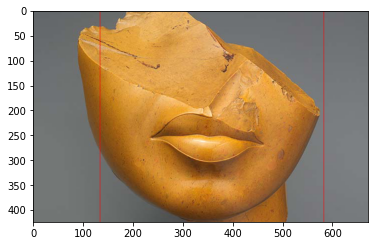

4 0038.jpeg 4
5 0018.jpeg 5
6 0254.jpeg 6
((248, 247), (388, 425))


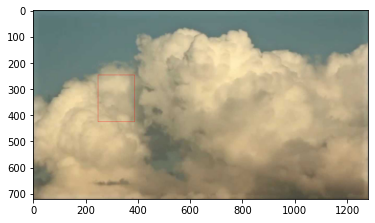

7 0262.jpeg 7
((129, 161), (250, 309))


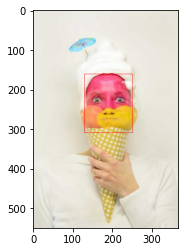

8 0223.jpeg 8
((19, 31), (174, 241))


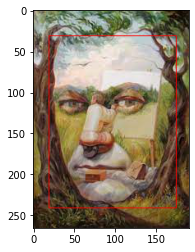

9 0203.jpeg 9
10 0274.jpeg 10
11 0235.jpeg 11
((57, 67), (142, 251))
((12, 20), (64, 83))
((108, 19), (150, 74))


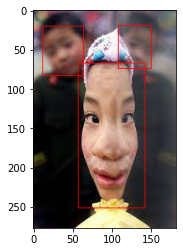

12 0167.jpeg 12
13 .DS_Store 13
14 0022.jpeg 14
((411, 17), (1015, 720))


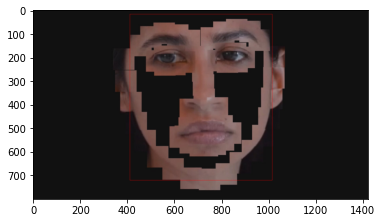

15 0219.jpeg 15
((58, 59), (165, 193))


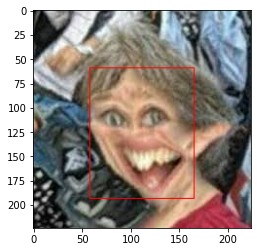

16 0130.jpeg 16
((175, 316), (618, 830))


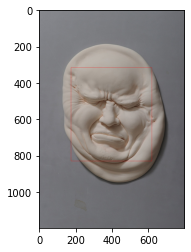

17 0188.jpeg 17
18 0075.jpeg 18
19 0126.jpeg 19
20 0063.jpeg 0
waiting ....
((148, 33), (500, 500))


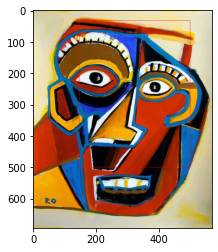

21 0258.jpeg 1
22 0034.jpeg 2
23 0171.jpeg 3
((143, 26), (741, 765))


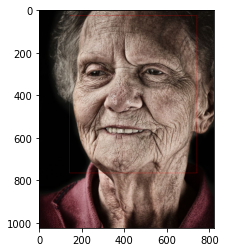

24 0170.jpeg 4
25 0259.jpeg 5
26 0127.jpeg 6
27 0035.jpeg 7
((54, -34), (532, 503))


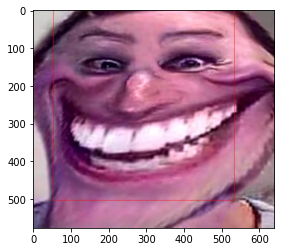

28 0062.jpeg 8
29 0131.jpeg 9
30 0074.jpeg 10
31 0218.jpeg 11
32 0058.jpeg 12
33 0234.jpeg 13
((22, 14), (178, 216))


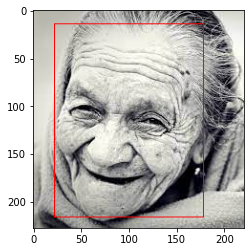

34 0023.jpeg 14
((328, 181), (823, 754))


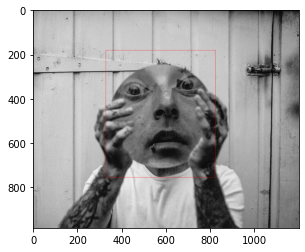

35 0189.jpeg 15
36 0263.jpeg 16
37 0166.jpeg 17
38 0019.jpeg 18
39 0275.jpeg 19
40 0222.jpeg 0
waiting ....
41 0255.jpeg 1
42 0193.jpeg 2
43 0039.jpeg 3
((200, 81), (382, 284))


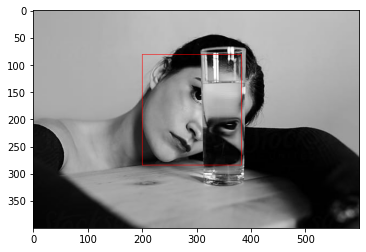

44 0202.jpeg 4
((256, 237), (305, 298))
((136, 256), (182, 318))


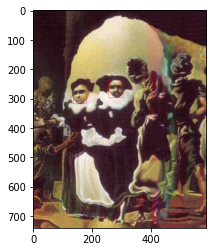

45 0081.jpeg 5
((136, 37), (226, 182))


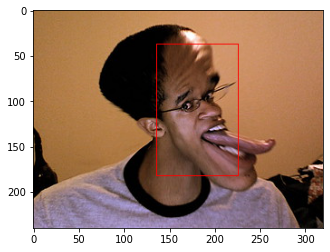

46 0097.jpeg 6
47 0214.jpeg 7
((35, -2), (217, 156))


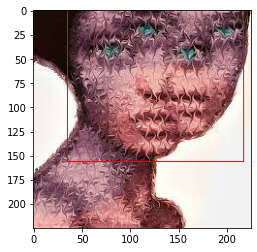

48 0078.jpeg 8
49 0243.jpeg 9
((127, 146), (298, 390))


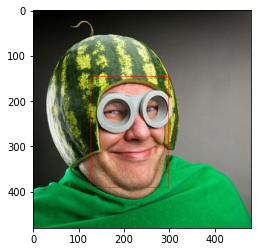

50 0185.jpeg 10
51 0238.jpeg 11
52 0054.jpeg 12
((87, 147), (464, 711))
((743, 179), (928, 469))


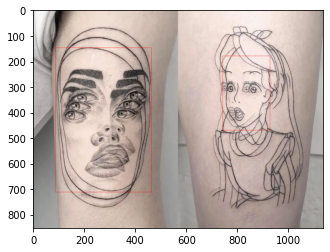

53 0111.jpeg 13
54 0280.jpeg 14
((968, 153), (1114, 404))


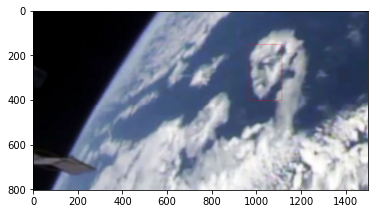

55 0003.jpeg 15
56 0146.jpeg 16
57 0015.jpeg 17
58 0279.jpeg 18
59 0150.jpeg 19
60 0042.jpeg 0
waiting ....
((346, 745), (774, 1253))


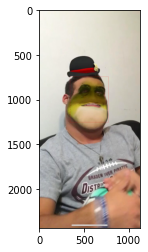

61 0107.jpeg 1
((197, 65), (686, 680))


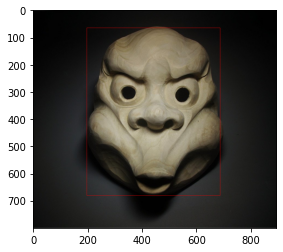

62 0141.jpeg 2
((136, 181), (222, 250))


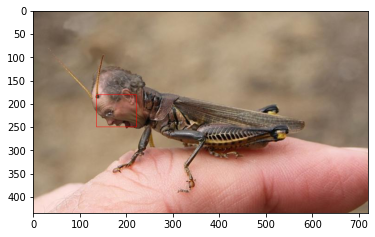

63 0116.jpeg 3
((88, 29), (1030, 1030))


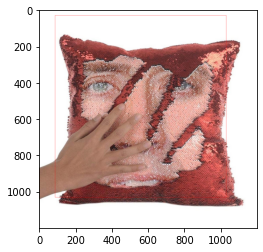

64 0287.jpeg 4
((123, 59), (610, 593))


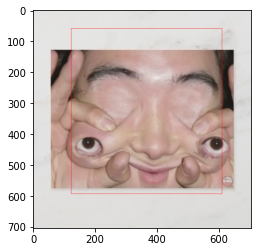

65 0268.jpeg 5
66 0053.jpeg 6
67 0028.jpeg 7
68 0182.jpeg 8
69 0090.jpeg 9
70 0244.jpeg 10
((66, 98), (422, 590))


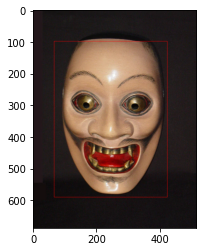

71 0213.jpeg 11
((14, 10), (204, 232))


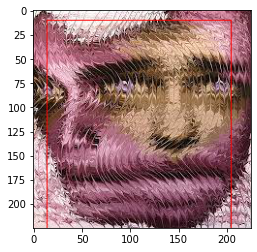

72 0069.jpeg 12
73 0205.jpeg 13
74 0252.jpeg 14
75 0194.jpeg 15
76 0204.jpeg 16
((130, 126), (386, 436))


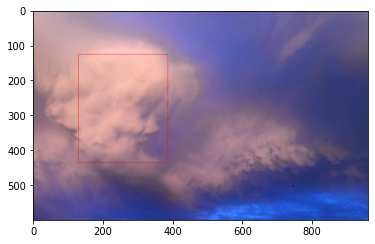

77 0086.jpeg 17
78 0253.jpeg 18
79 0195.jpeg 19
80 0087.jpeg 0
waiting ....
81 0068.jpeg 1
82 0091.jpeg 2
83 0212.jpeg 3
((20, -7), (214, 220))


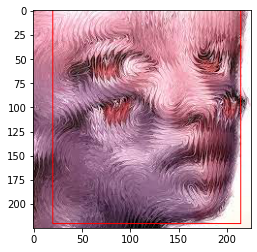

84 0029.jpeg 4
((52, 64), (192, 232))


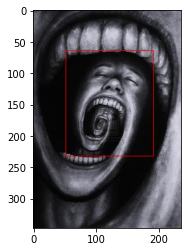

85 0245.jpeg 5
((289, 335), (457, 528))


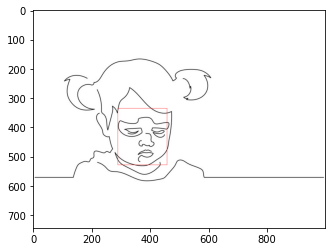

86 0183.jpeg 6
87 0052.jpeg 7
88 0117.jpeg 8
89 0269.jpeg 9
90 0286.jpeg 10
((152, -5), (376, 174))


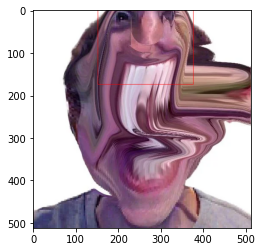

91 0005.jpeg 11
((163, 144), (452, 554))
((275, 263), (314, 307))


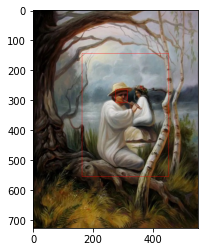

92 0140.jpeg 12
((129, 70), (292, 272))


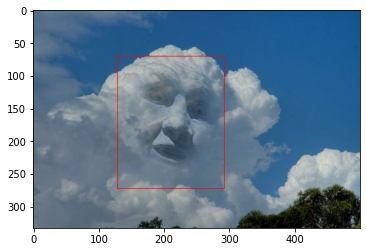

93 0013.jpeg 13
((41, 42), (195, 271))


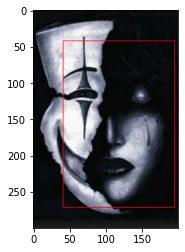

94 0156.jpeg 14
((101, 7), (454, 435))


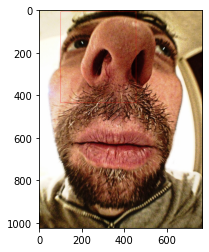

95 0228.jpeg 15
((71, 40), (156, 168))


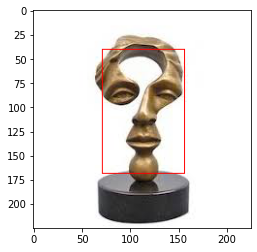

96 0044.jpeg 16
97 0101.jpeg 17
((194, 184), (599, 749))


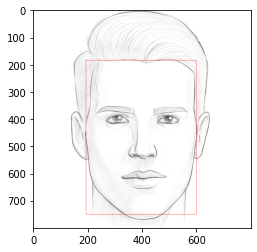

98 0176.jpeg 18
((220, 184), (469, 552))


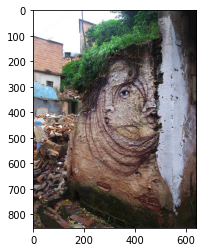

99 0033.jpeg 19
((196, 89), (543, 572))


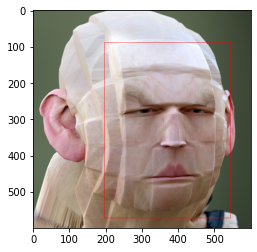

100 0199.jpeg 0
waiting ....
((277, 441), (388, 578))


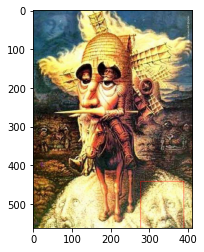

101 0121.jpeg 1
102 0137.jpeg 2
103 0064.jpeg 3
((106, 117), (725, 987))


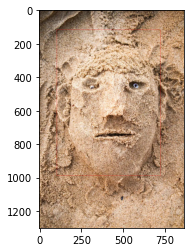

104 0072.jpeg 4
105 0208.jpeg 5
((136, 4), (268, 180))
((23, 31), (97, 146))


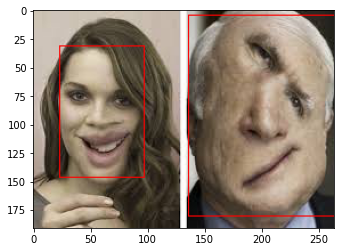

106 0160.jpeg 6
107 0025.jpeg 7
((102, 60), (197, 177))


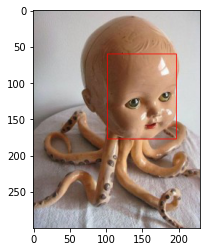

108 0249.jpeg 8
((111, 32), (503, 514))


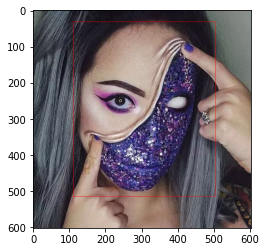

109 0232.jpeg 9
110 0265.jpeg 10
111 0009.jpeg 11
112 0273.jpeg 12
113 0224.jpeg 13
114 0043.jpeg 14
115 0151.jpeg 15
((158, 74), (499, 525))


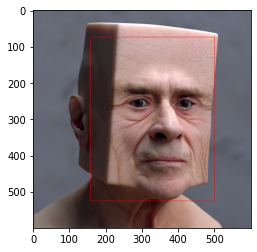

116 0014.jpeg 16
((262, 124), (387, 287))


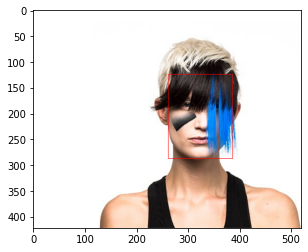

117 0106.jpeg 17
118 0048.jpeg 18
119 0278.jpeg 19
120 0002.jpeg 0
waiting ....
121 0147.jpeg 1
122 0055.jpeg 2
((248, 186), (374, 383))


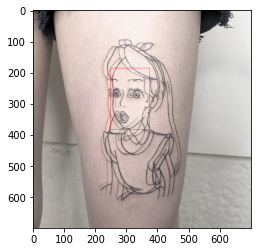

123 0110.jpeg 3
124 0239.jpeg 4
125 0281.jpeg 5
((36, 53), (246, 378))


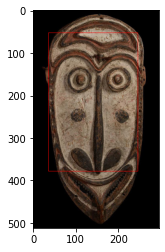

126 0242.jpeg 6
((107, -89), (559, 413))


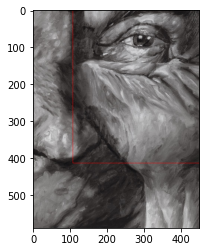

127 0184.jpeg 7
128 0096.jpeg 8
129 0215.jpeg 9
((-4, 4), (195, 282))


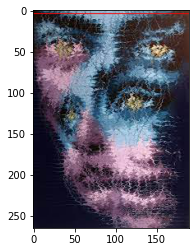

130 0079.jpeg 10
131 0010.jpeg 11
132 0142.jpeg 12
133 0102.jpeg 13
134 0046.jpeg 14
135 0154.jpeg 15
((144, 132), (265, 303))


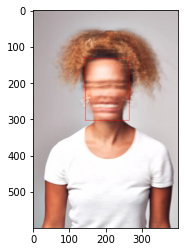

136 0047.jpeg 16
137 0103.jpeg 17
138 0011.jpeg 18
((102, 60), (249, 267))


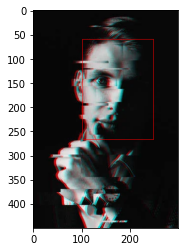

139 0007.jpeg 19
((-25, 181), (413, 611))
((243, 96), (658, 544))


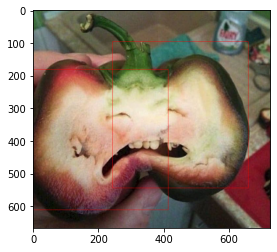

140 0284.jpeg 0
waiting ....
((119, 21), (345, 236))


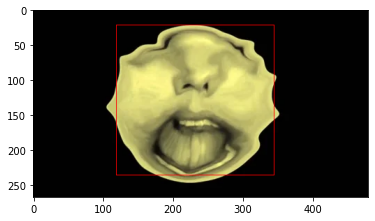

141 0115.jpeg 1
142 0181.jpeg 2
((356, 224), (692, 684))


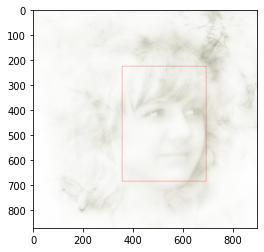

143 0050.jpeg 3
((223, 235), (389, 407))
((321, 129), (379, 192))


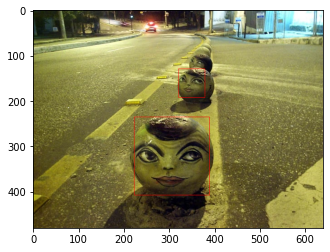

144 0247.jpeg 4
145 0093.jpeg 5
((595, -28), (1667, 1270))


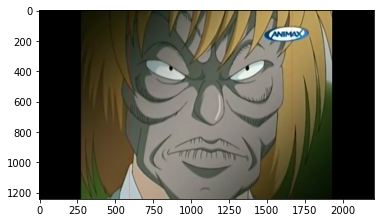

146 0210.jpeg 6
147 0085.jpeg 7
148 0139.jpeg 8
149 0206.jpeg 9
150 0197.jpeg 10
151 0178.jpeg 11
152 0226.jpeg 12
((168, 46), (222, 150))


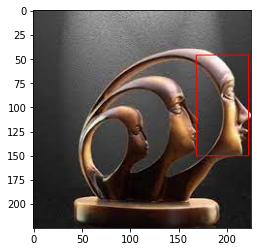

153 0267.jpeg 13
154 0288.jpeg 14
((33, 72), (415, 660))


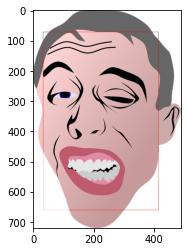

155 0271.jpeg 15
((295, 65), (775, 872))


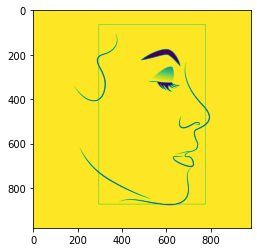

156 0158.jpeg 16
((27, 44), (223, 322))


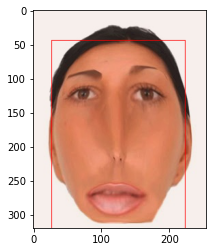

157 0251.jpeg 17
((284, 271), (805, 837))


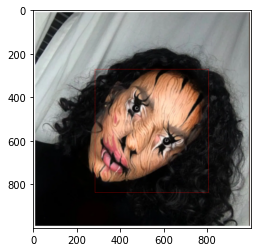

158 0230.jpeg 18
((78, 65), (132, 138))


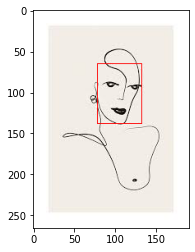

159 0119.jpeg 19
160 0027.jpeg 0
waiting ....
161 0162.jpeg 1
162 0066.jpeg 2
163 0089.jpeg 3
164 0135.jpeg 4
165 0070.jpeg 5
166 0123.jpeg 6
167 0031.jpeg 7
((306, 5), (534, 387))


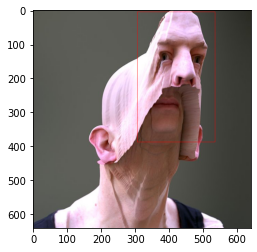

168 0049.jpeg 8
169 0225.jpeg 9
170 0174.jpeg 10
171 0272.jpeg 11
172 0008.jpeg 12
((991, 334), (1471, 985))


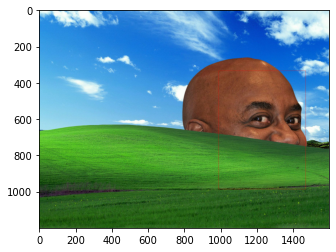

173 0024.jpeg 13
174 0073.jpeg 14
175 0264.jpeg 15
((102, 49), (214, 246))
((294, 142), (386, 271))


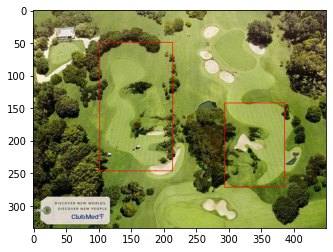

176 0120.jpeg 16
177 0233.jpeg 17
((151, 10), (254, 170))
((19, 17), (116, 167))


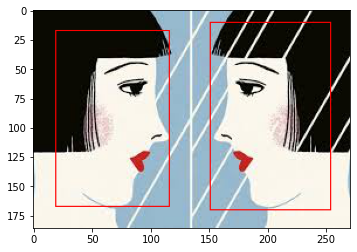

178 0161.jpeg 18
179 0248.jpeg 19
((149, 440), (560, 952))
((239, 71), (439, 331))


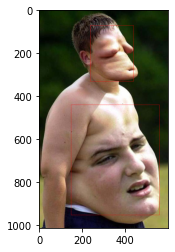

180 0136.jpeg 0
waiting ....
((42, 53), (183, 228))


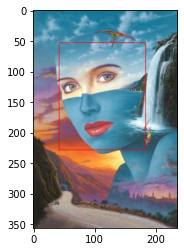

181 0209.jpeg 1
((38, 41), (155, 205))


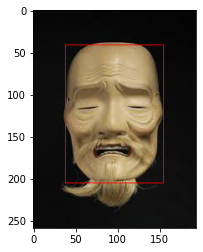

182 0100.jpeg 2
((263, 38), (732, 519))


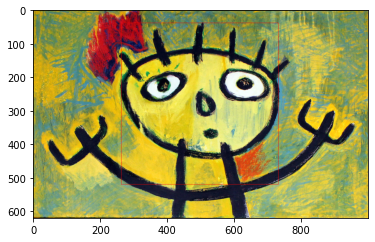

183 0198.jpeg 3
184 0032.jpeg 4
((74, 134), (665, 992))


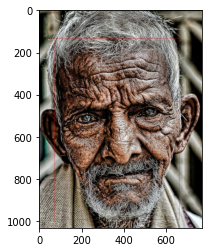

185 0065.jpeg 5
((-85, -155), (1045, 1404))


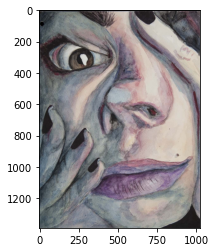

186 0177.jpeg 6
187 0045.jpeg 7
188 0157.jpeg 8
189 0229.jpeg 9
190 0012.jpeg 10
((274, 21), (553, 382))


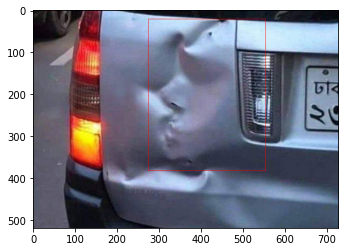

191 0004.jpeg 11
192 0109.jpeg 12
((861, 430), (1412, 1188))


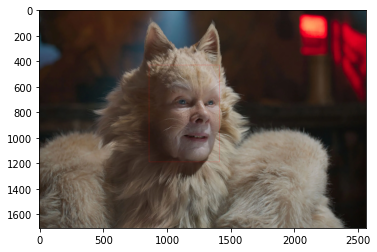

193 0221.jpeg 13
((11, 30), (125, 181))


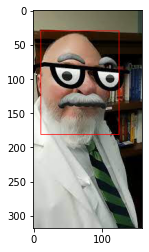

194 0276.jpeg 14
195 0108.jpeg 15
((114, 9), (822, 840))


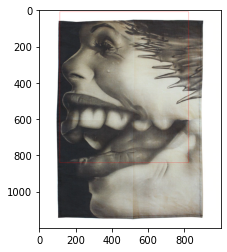

196 0220.jpeg 16
((74, 45), (165, 170))


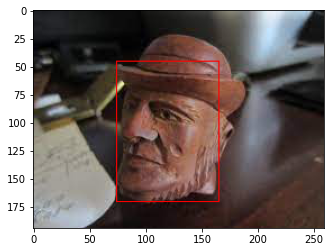

197 0277.jpeg 17
((87, 29), (417, 441))


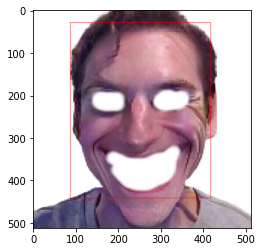

198 0261.jpeg 18
((123, 189), (442, 621))


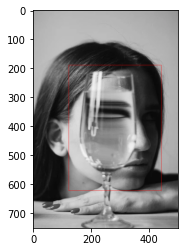

199 0148.jpeg 19
((303, 370), (678, 794))


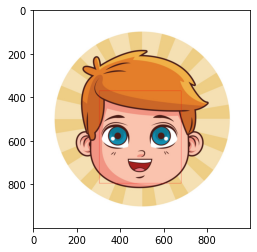

200 0236.jpeg 0
waiting ....
((44, 48), (137, 178))


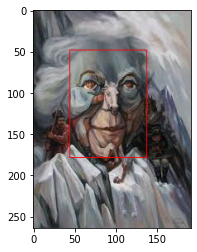

201 0021.jpeg 1
202 0076.jpeg 2
((277, 37), (791, 506))


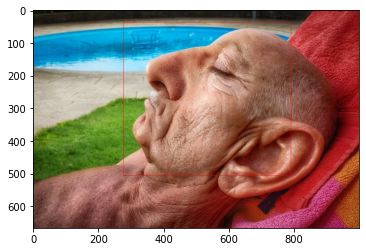

203 0164.jpeg 3
((5, 22), (189, 189))


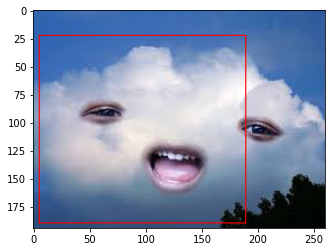

204 0125.jpeg 4
((67, 12), (258, 243))


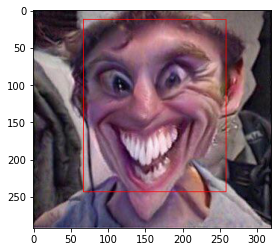

205 0099.jpeg 5
206 0037.jpeg 6
((69, 81), (269, 296))


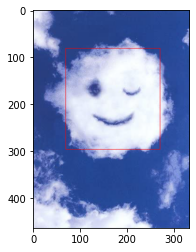

207 0060.jpeg 7
208 0133.jpeg 8
209 0172.jpeg 9
((100, 26), (498, 526))


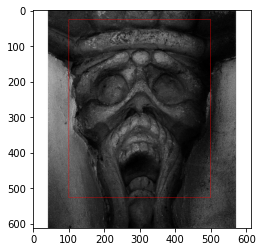

210 0105.jpeg 10
((199, 207), (458, 534))


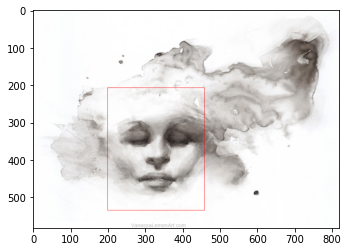

211 0040.jpeg 11
((110, 40), (289, 228))


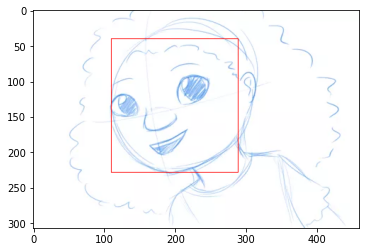

212 0017.jpeg 12
213 0144.jpeg 13
((145, 55), (314, 293))


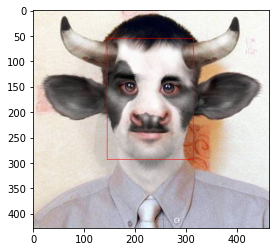

214 0152.jpeg 14
((59, 0), (177, 156))


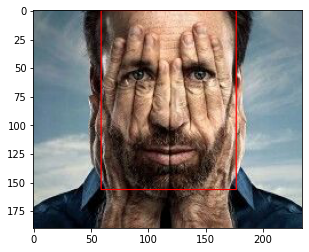

215 0282.jpeg 15
216 0001.jpeg 16
217 0113.jpeg 17
((95, 175), (776, 1156))


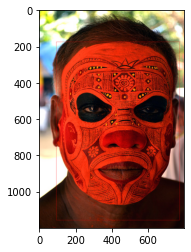

218 0056.jpeg 18
219 0187.jpeg 19
((186, 17), (1044, 792))


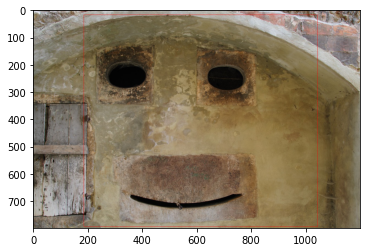

220 0168.jpeg 0
waiting ....
((62, 8), (205, 218))


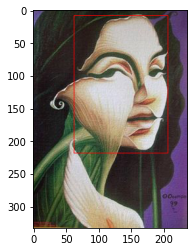

221 0241.jpeg 1
((128, 91), (205, 225))


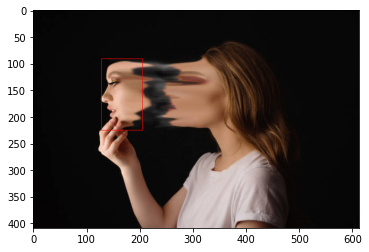

222 0200.jpeg 2
((125, 110), (659, 805))


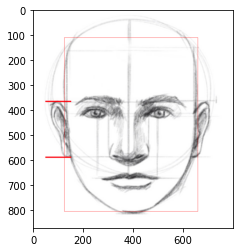

223 0083.jpeg 3
((268, 100), (357, 236))


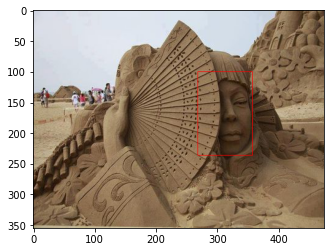

224 0129.jpeg 4
((205, 250), (596, 753))


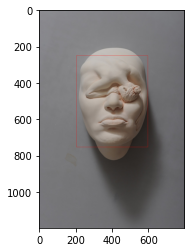

225 0216.jpeg 5
226 0095.jpeg 6
((261, 52), (399, 233))


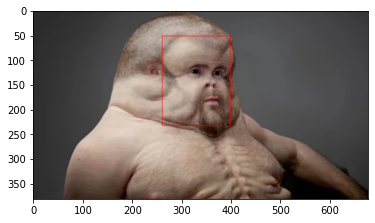

227 0191.jpeg 7
228 0257.jpeg 8
((1299, 520), (1762, 1116))


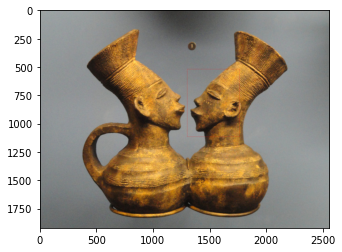

229 0030.jpeg 9
230 0067.jpeg 10
231 0175.jpeg 11
232 0071.jpeg 12
233 0122.jpeg 13
234 0118.jpeg 14
235 0088.jpeg 15
236 0134.jpeg 16
((16, 22), (209, 290))


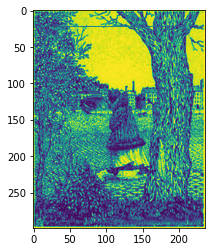

237 0289.jpeg 17
((29, -22), (435, 422))


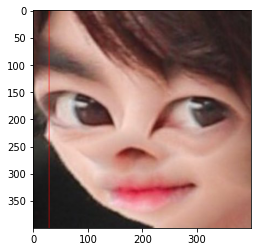

238 0026.jpeg 18
((133, 130), (529, 635))


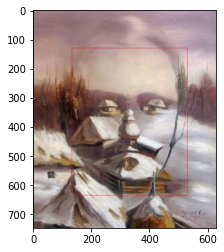

239 0163.jpeg 19
240 0231.jpeg 0
waiting ....
241 0266.jpeg 1
242 0270.jpeg 2
((1504, 135), (1755, 447))
((884, 763), (1110, 1073))


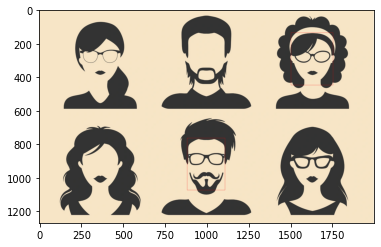

243 0227.jpeg 3
((38, 9), (198, 198))


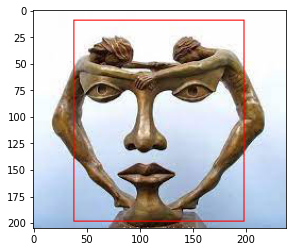

244 0159.jpeg 4
((202, 296), (820, 1160))


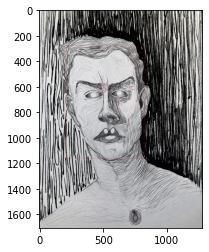

245 0250.jpeg 5
((106, 164), (495, 682))


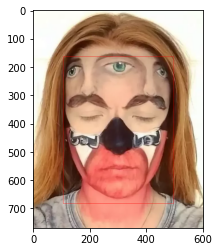

246 0196.jpeg 6
247 0179.jpeg 7
248 0207.jpeg 8
((53, 90), (127, 178))


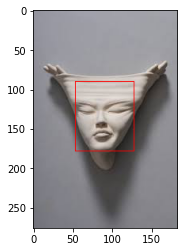

249 0084.jpeg 9
((307, 133), (456, 313))


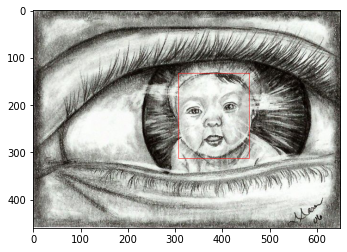

250 0211.jpeg 10
((9, 6), (198, 219))


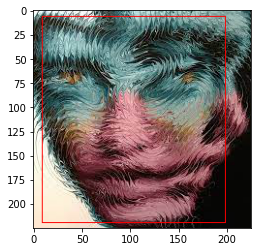

251 0092.jpeg 11
((153, 184), (346, 457))


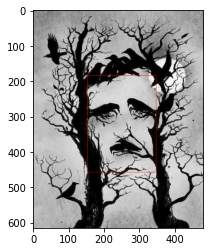

252 0246.jpeg 12
((171, 76), (958, 1161))


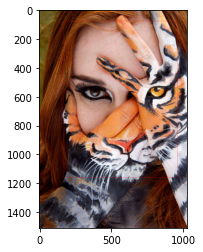

253 0180.jpeg 13
((192, 56), (581, 529))


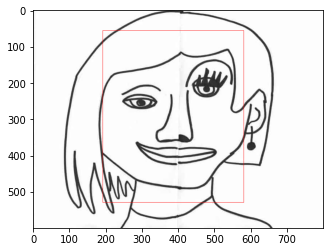

254 0051.jpeg 14
255 0114.jpeg 15
((355, 240), (600, 644))


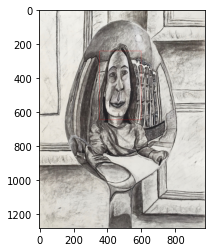

256 0138.jpeg 16
257 0285.jpeg 17
((54, 8), (748, 1010))


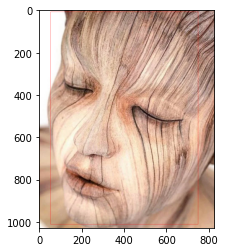

258 0143.jpeg 18
259 0006.jpeg 19
260 0155.jpeg 0
waiting ....
((133, 50), (264, 223))


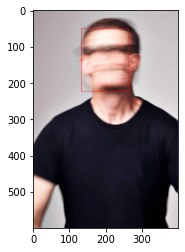

261 0190.jpeg 1
262 0256.jpeg 2
((248, 148), (938, 1032))


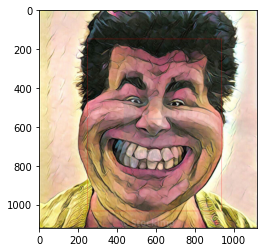

263 0201.jpeg 3
264 0128.jpeg 4
((355, 379), (412, 456))


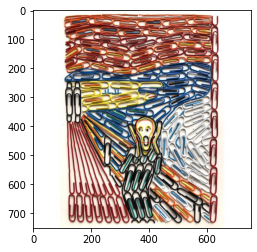

265 0082.jpeg 5
266 0217.jpeg 6
267 0094.jpeg 7
((50, 111), (408, 688))


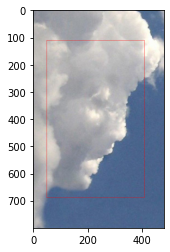

268 0240.jpeg 8
269 0186.jpeg 9
270 0169.jpeg 10
((145, 235), (298, 436))
((448, 220), (545, 340))


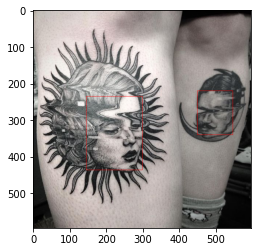

271 0112.jpeg 11
((399, 70), (897, 625))


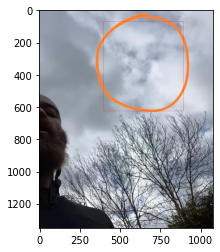

272 0057.jpeg 12
273 0145.jpeg 13
((120, 265), (203, 353))


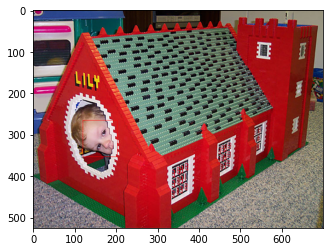

274 0283.jpeg 14
275 0104.jpeg 15
((142, 129), (393, 485))


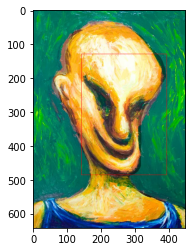

276 0016.jpeg 16
((82, 47), (175, 167))
((19, 59), (83, 147))


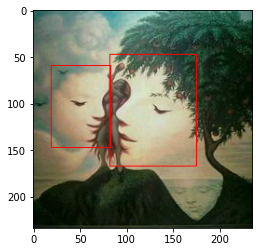

277 0153.jpeg 17
((267, 135), (413, 307))


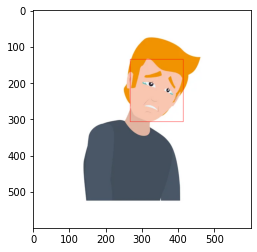

278 0041.jpeg 18
279 0036.jpeg 19
280 0173.jpeg 0
waiting ....
281 0124.jpeg 1
((4, 6), (216, 268))


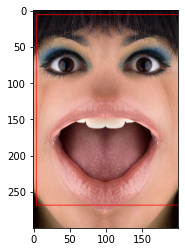

282 0061.jpeg 2
((10, -83), (540, 651))


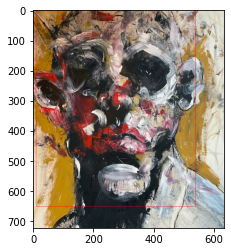

283 0132.jpeg 3
284 0077.jpeg 4
285 0020.jpeg 5
286 0098.jpeg 6
287 0165.jpeg 7
288 0237.jpeg 8
289 0149.jpeg 9
((15, -27), (527, 450))


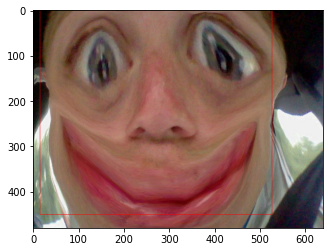

290 0260.jpeg 10
((279, 409), (927, 1140))


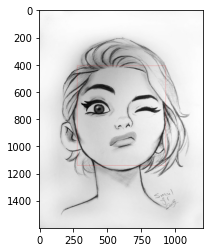

131
[('0080.jpeg', ((49, 70), (193, 263))), ('0192.jpeg', ((134, -51), (583, 433))), ('0254.jpeg', ((248, 247), (388, 425))), ('0262.jpeg', ((129, 161), (250, 309))), ('0223.jpeg', ((19, 31), (174, 241))), ('0235.jpeg', ((57, 67), (142, 251))), ('0235.jpeg', ((12, 20), (64, 83))), ('0235.jpeg', ((108, 19), (150, 74))), ('0022.jpeg', ((411, 17), (1015, 720))), ('0219.jpeg', ((58, 59), (165, 193))), ('0130.jpeg', ((175, 316), (618, 830))), ('0063.jpeg', ((148, 33), (500, 500))), ('0171.jpeg', ((143, 26), (741, 765))), ('0035.jpeg', ((54, -34), (532, 503))), ('0234.jpeg', ((22, 14), (178, 216))), ('0023.jpeg', ((328, 181), (823, 754))), ('0039.jpeg', ((200, 81), (382, 284))), ('0202.jpeg', ((256, 237), (305, 298))), ('0202.jpeg', ((136, 256), (182, 318))), ('0081.jpeg', ((136, 37), (226, 182))), ('0214.jpeg', ((35, -2), (217, 156))), ('0243.jpeg', ((127, 146), (298, 390))), ('0054.jpeg', ((87, 147), (464, 711))), ('0054.jpeg', ((743, 179), (928, 469))), ('0280.jpeg', ((968, 153), (1114, 4

In [99]:
import time
from matplotlib import pyplot as plt
# Detect a face in an image that contains a single face
  # single_face_image_url = 'https://raw.githubusercontent.com/Microsoft/Cognitive-Face-Windows/master/Data/detection1.jpg'
  # single_image_name = os.path.basename(single_face_image_url)

# We use detection model 3 to get better performance.
  # detected_faces = face_client.face.detect_with_url(url=single_face_image_url, detection_model='detection_03')


def getRectangle(faceDictionary):
    rect = faceDictionary.face_rectangle
    left = rect.left
    top = rect.top
    right = left + rect.width
    bottom = top + rect.height
    
    return ((left, top), (right, bottom))

def drawFaceRectangles(img) :
# Download the image from the url
#     response = requests.get(single_face_image_url)
#     img = Image.open(BytesIO(response.content))

# # For each face returned use the face rectangle and draw a red box.
#     print('Drawing rectangle around face... see popup for results.')
    draw = ImageDraw.Draw(img)
    for face in detected_faces:
        print(getRectangle(face))
        draw.rectangle(getRectangle(face), outline='red')


files = os.listdir('drive/MyDrive/face/')
    
total = 0
res = []

for idx, f in  enumerate(files, 1):
  print(idx,f, idx%20)

  if (idx%20 == 0):
    print('waiting ....')
    time.sleep(70)


  if not f.endswith('.jpeg'): continue
  image = open(f'drive/MyDrive/face/{f}', 'r+b')
  img = Image.open(f'drive/MyDrive/face/{f}')

  detected_faces = face_client.face.detect_with_stream(image, detection_model='detection_03') #, recognition_model='recognition_04', return_face_attributes=['qualityForRecognition'])

  if not detected_faces: continue
    # raise Exception('No face detected from image {}'.format(f))
  total = total + 1 

  # drawFaceRectangles(img)

  draw = ImageDraw.Draw(img)
  for face in detected_faces:
      print(getRectangle(face))
      ff = getRectangle(face)
      draw.rectangle(ff, outline='red')
      res.append((f, ff))


  plt.imshow(img)
  plt.show()
  


# Uncomment this to show the face rectangles.

print(total)
print(res)

In [84]:
40%20 == 0

True

In [100]:
131/289

0.4532871972318339

In [19]:
%matplotlib inline

In [ ]:
image_path  = './face/0016.jpeg'

face_api_url = 'https://borjiface.cognitiveservices.azure.com/face/'
image_data = open(image_path, 'rb').read()



                         
                         

                         
                         
import http.client, urllib.request, urllib.parse, urllib.error, base64

headers = {
    # Request headers
    'Content-Type': 'application/json',
    'Ocp-Apim-Subscription-Key': '6122f16de8e545b1b0fc8c18eafbbf45',
}

params = urllib.parse.urlencode({
    # Request parameters
    'returnFaceId': 'true',
    'returnFaceLandmarks': 'false',
    'returnFaceAttributes': '{string}',
    'recognitionModel': 'recognition_04',
    'returnRecognitionModel': 'false',
    'detectionModel': 'detection_03',
    'faceIdTimeToLive': '86400',
})

# try:
    # conn = http.client.HTTPSConnection('westus.api.cognitive.microsoft.com')
    # conn.request("POST", "/face/v1.0/detect?%s" % params, "{body}", headers)
    # response = conn.getresponse()
    # data = response.read()
    # print(data)
    # conn.close()
    
response = requests.post(face_api_url, params = params, headers = headers, data=image_data)    
                             
# except Exception as e:
#     print("[Errno {0}] {1}".format(e.errno, e.strerror))
                         
                             
print(json.dumps(response.json()))                         
                             

MemoryError: Cannot allocate write+execute memory for ffi.callback(). You might be running on a system that prevents this. For more information, see https://cffi.readthedocs.io/en/latest/using.html#callbacks